### 特征工程
1. 针对性地学习特征工程:
    - 数据处理
    - 特征选择
    - 维度压缩
2. 数据处理
    - 统一单位/量级:
        - 0-1标准化: X-min / Max-min,  `from sklearn.preprocessing import MinMaxScaler`
        - Z标准化: X-mean / std , 这是z-score 方法, `from sklearn.preprocessing import scale`
        - 归一化(Normalization): x / sum(x^2), `from sklearn.preprocessing import Normalizer`
        - 标准化和归一化的区别: 
            - 标准化是将 特征值转换到同一量级
            - 归一化, 将样本向量转为 单位向量
    - 虚拟变量/哑变量/离散特征编码( dummy variable), 用来表示分类变量/非数据因素可能产生的影响
        - 对定量特征 二值化: 设定threshold, 大为1, 小为0: `from sklearn.preprocessing import Binarizer`
        - 如果离散值之间有大小意义, 其大小可能与输出有正负相关关系:
            - e.g: 尺寸, 日期, 楼层, 学历
            - 处理: 
                - 按大小用数字代替
                - 对于日期YYYY-mm-dd, 拆分成几维: 根据你的判断, 看看输出和日期怎样产生关联
                    - 年: YYYY
                    - 月: mm
                    - 星期: day_name
                    - 距离如今多少年: passed_years
                    - 距离如今多少月: passed_months
                    - 距离如今多少天: passed_days
                - 方法: `pandas.Seris.map(dict)`
        - 如果没有大小意义:
            - e.g: 颜色, 朝向, 性别
            - 处理方法: 变成0和1两列, `pandas.get_dummies()`
    - 处理缺失值:
        - 数据补齐
            - 使用统计指标填充缺失值, e.g: 平均值, 中位数, 众数
            - 
        - 删除缺失行
        - 不处理
    - 数据变换: 
        - 多项式: `from sklearn.preprocessing import PolynomialFeatures`
        - 指数函数: `from sklearn.preprocessing import FunctionTransformer`
        - 对数函数
3. 特征选择: feature selection, attribute selection
    - Why select?
        - 特征过多, 容易引起维度灾难, 导致模型复杂, 训练时间长, 泛化能力也会下降
        - 特征过多, 特征之间 可能存在关联 -> 剔除 不相关/冗余的特征
    - How to select?
        - 是否发散?
            - 如果特征不发散, 比如方差接近于0, 则样本在这个特征上没有差异, 去之
        - 是否相关?
            - 如果特征和label高度相关, 则应该优先选择
    - Methods:
        - 方差选择法: 设置方差阈值: `from sklearn.feature_selection import VarianceThreshold`
        - 相关系数法: 计算各个特征对label的相关系数, 选择更相关的特征: `from sklearn.feature_selection import SelectKBest`
        - 递归特征消除法: 多次训练一个基础模型, 保留w绝对值大的维度: 使用L1惩罚项
        - `from sklearn.feature_selection import SelectFromModel`
4. 降维:
    - PCA(Principal Components Analysis)
        - 数据中心化: 每个特征维度减去相应的均值
        - 计算协方差矩阵 以及 它的特征值和特征向量
        - 将特征值从大到小排序, 并保留最上边的N个特征
        - 将高维数据转换到N个特征向量构成的新空间中
    - LDA(线性判别分析法)
5. 需要专家知识 的特征工程:
    - 身高and体重: BMI系数
    - 计算机视觉: SIFT算子
    - 声纹识别任务: MFCC, 梅尔频率倒谱系数
6. 特征工程方法:
    - 核心: 何时选用何用方法, 为什么选择这种方法
    - 类别特征
        - one-hot encoding
            - 产生稀疏数据
        - hash encoding
            - 使用hash函数, 将值映射到新列
        - label encoding
            - 给离散型变量 一个数值id
            - 用于 non-linear
        - count encoding
            - 用训练集中 离散型变量的freq 代替
            - 用于linear和non-linear
            - 可以加log转换
            - 测试集怎么处理, 同样计算freq吧
        - label-count encoding
            - 用 离散型变量 的 freq 排序后的索引, 来代替
            - 出现频率高的, 索引大
            - 用于linear和non-linear
        - target encoding
            - 某标签 在 某离散型变量中的比例
            - 小心过拟合
        - category embedding
            - 类似 word embedding, 将 离散型变量 投射到Euclidean Space中
        - Nan encoding
            - 把NaN当做 一个离散值
        - Polynomial encoding
        - expansion encoding
            - Split 拆分成多列
        - consolidation encoding
            - 处理可能是相同值的不同值, 比如拼写错误
    - 数值特征
        - rounding
        - binning
        - scaling
        - imputation, 猜值
        - no linear encoding
        - row statstics
7. 相关系数
    - 皮尔逊: 适用于判断两个连续变脸呈线性相关时
    - pointbiserialr, 点二列相关系数: 适用于二分类的列
    - Spearman, 斯皮尔曼等级相关系数: 适用于 顺序categorical变量
    - Kendall: 

#### 参考
- [Fundamental Techniques of Feature Engineering for Machine Learning](https://towardsdatascience.com/feature-engineering-for-machine-learning-3a5e293a5114)
- [知乎- 特征工程到底是什么](https://www.zhihu.com/question/29316149/answer/110159647)

### 他山之石, 可以攻玉
1. d2l 怎么做的特征工程:
    - 将所有 numerical 变量 做Z标准化: 减mean, 除以标准差
    - 将所有 categorical 变量 拆分成二元 
2. 思考:
    - 这个字段是什么类型变量
        - 数字: 要不要scale
        - 离散: 值之间有没有大小
    - 这个字段的现实意义
    - 这个字段呈现什么现象
    - 这个字段跟 label的关系
    - 这个字段的缺失值如何处理
3. d2l 的不合理之处:
    - 只对 object类型的列, 拆分离散型变量
    - 对数值型的 离散列, 也标准化了
    - 预处理数据后, 有些列, 只有一个值
4. 猪突改进: 步骤
    1. 填充缺失值:
        - 不要惧怕缺失值
        - Alley, GarageFinish, MasVnrType, BsmtQual, BsmtCond, BsmtExposure, Fence, MiscFeature, Electrical, FireplaceQu, GarageQual, GarageCond, GarageType
    2. 将有顺序的类型变量, 转为数值
        - 没有
    3. 转换年份为距离今年的差值
        - YrSold, 与 sale price的相关系数为 -0.029, 为什么小
        - YearRemodAdd
        - YearBuilt
        - GarageYrBlt
    4. 将类型变量拆分, nan也作为一列:
        - MoSold, 月份
        - 所有 object 类型的列
    5. 剩下的 数值型, 都z标准化
    6. 去掉无用的列:
        - 只有一个值的
        - 相关系数低于0.01的
    7. 对sale price 取log
        - 小心
    7. 加上测试集, 一起预处理
        
翻译.
    - garage, 车库
    - MSSubClass, 建筑类型

### 以 Kaggle预测房价 为例
1. 目标: 误差突破0.14
2. 字段:
    - MSSubClass


In [131]:
import numpy as np
import pandas as pd
from datetime import datetime
from IPython import display
from collections import Counter
from matplotlib import pyplot as plt
from mxnet import autograd, nd, init as ginit
from scipy.stats import pearsonr, kendalltau, spearmanr, pointbiserialr
from mxnet.gluon import nn, loss as gloss, data as gdata, Trainer as gTrainer
pd.set_option('display.max_columns', 999)

In [211]:
# 读取数据 using pandas
train_data = pd.read_csv("./DataResources/PA_1/train.csv")
test_data = pd.read_csv("./DataResources/PA_1/test.csv")
train_data = train_data.iloc[np.random.permutation(len(train_data))]  # 打乱 顺序

In [132]:
# 统计所有字段的缺失率和值频率
def count_missing_rate(dataset, include_zero=False):
    """
    :param dataset: pd.DataFrame
    :return dict: 缺失值多的字段靠前
    """
    size, _ = dataset.shape
    missing_rates = list()
    for col in dataset.columns:
        missing = sum(dataset[col].isnull())
        if not include_zero and missing == 0:
            continue
        missing_rates.append((col, round(missing / size * 100, 2)))
    return dict(sorted(missing_rates, key=lambda x:x[1], reverse=True))


def count_column_distinct(dataset, rate=0.5):
    """
    :param dataset: pd.Dataframe
    :param rate: 是不是刨去distinct 超过半数的, distinct/size 小于 rate的保留下来
    :return dict: distinct 少的靠前
    """
    distincts = list()
    size, _ = dataset.shape
    for col in dataset.columns:
        distinct = list(set(dataset[col].values))
        if len(distinct) / size > rate:
            continue
        distincts.append((col, distinct))
    return dict(sorted(distincts, key=lambda x: len(x[1])))


def count_column_correlation(dataset, target_column, distinct_rate=0.5):
    """
    计算distinct_rate 大于0.5的数值型的各列 跟label的相关系数, 低于corr_threshold的不要了
    |r|>0.95 存在显著性相关
    |r|≥0.8 高度相关
    0.5≤|r|<0.8 中度相关
    0.3≤|r|<0.5 低度相关
    |r|<0.3 关系极弱，认为不相关
    """
    size, _ = dataset.shape
    numerical = dataset[dataset.dtypes[dataset.dtypes != 'object'].index]
    col2peason = list()
    for col in numerical:
        if col == target_column:
            continue
        not_nan_ind = numerical[col].notnull()
        values = numerical[not_nan_ind][col].values
        distinct = len(set(values))
        if distinct / size < distinct_rate and distinct > 1:
            targets = dataset[not_nan_ind][target_column]
            peason_r, p_value = pearsonr(values, targets)
            col2peason.append((col, peason_r))
    return dict(sorted(col2peason, key=lambda x: abs(x[1]), reverse=True))


# def count_column_

In [212]:
peason_corr_dict = count_column_correlation(train_data, 'SalePrice')
for col in peason_corr_dict:
    print(col, " -> ", peason_corr_dict[col])

OverallQual  ->  0.7909816005838048
GarageCars  ->  0.6404091972583521
GarageArea  ->  0.6234314389183616
TotalBsmtSF  ->  0.6135805515591954
FullBath  ->  0.560663762748446
TotRmsAbvGrd  ->  0.5337231555820282
YearBuilt  ->  0.5228973328794968
YearRemodAdd  ->  0.5071009671113861
GarageYrBlt  ->  0.4863616774878608
MasVnrArea  ->  0.4774930470957155
Fireplaces  ->  0.46692883675152785
BsmtFinSF1  ->  0.38641980624215333
LotFrontage  ->  0.35179909657067787
WoodDeckSF  ->  0.32441344456813
2ndFlrSF  ->  0.31933380283206775
OpenPorchSF  ->  0.31585622711605527
HalfBath  ->  0.2841076755947825
BsmtFullBath  ->  0.22712223313149427
BedroomAbvGr  ->  0.16821315430073996
KitchenAbvGr  ->  -0.1359073708421412
EnclosedPorch  ->  -0.12857795792595678
ScreenPorch  ->  0.1114465711429112
PoolArea  ->  0.0924035494918732
MSSubClass  ->  -0.0842841351265952
OverallCond  ->  -0.07785589404867803
MoSold  ->  0.046432245223819335
3SsnPorch  ->  0.04458366533574841
YrSold  ->  -0.028922585168730322
Lo

In [213]:
corr_mat = train_data[train_data.dtypes[train_data.dtypes != 'object'].index[1:]].corr()
for i, col in enumerate(corr_mat.columns):
    for j, row in enumerate(corr_mat[col].index):
        if i > j and 0.8 <= abs(corr_mat[col][row]):
            print("{} & {}: {}".format(col, row, corr_mat[col][row]))

1stFlrSF & TotalBsmtSF: 0.819529975005033
TotRmsAbvGrd & GrLivArea: 0.8254893743088378
GarageYrBlt & YearBuilt: 0.8256674841743447
GarageArea & GarageCars: 0.88247541428146


In [214]:
pearsonr(train_data['LotArea'], train_data['SalePrice'])
pearsonr?

In [215]:
corr_mat['SalePrice'][corr_mat['SalePrice'] < 0.3]

MSSubClass      -0.084284
LotArea          0.263843
OverallCond     -0.077856
BsmtFinSF2      -0.011378
BsmtUnfSF        0.214479
LowQualFinSF    -0.025606
BsmtFullBath     0.227122
BsmtHalfBath    -0.016844
HalfBath         0.284108
BedroomAbvGr     0.168213
KitchenAbvGr    -0.135907
EnclosedPorch   -0.128578
3SsnPorch        0.044584
ScreenPorch      0.111447
PoolArea         0.092404
MiscVal         -0.021190
MoSold           0.046432
YrSold          -0.028923
Name: SalePrice, dtype: float64

In [216]:
missing_rates = count_missing_rate(train_data)
for col in missing_rates:
    print(col, " -> ", missing_rates[col])

PoolQC  ->  99.52
MiscFeature  ->  96.3
Alley  ->  93.77
Fence  ->  80.75
FireplaceQu  ->  47.26
LotFrontage  ->  17.74
GarageType  ->  5.55
GarageYrBlt  ->  5.55
GarageFinish  ->  5.55
GarageQual  ->  5.55
GarageCond  ->  5.55
BsmtExposure  ->  2.6
BsmtFinType2  ->  2.6
BsmtQual  ->  2.53
BsmtCond  ->  2.53
BsmtFinType1  ->  2.53
MasVnrType  ->  0.55
MasVnrArea  ->  0.55
Electrical  ->  0.07


In [51]:
distinct_values = count_value_distinct(train_data)
for col in distinct_values:
    print(col, len(distinct_values[col]), " -> ", ",".join(map(str, distinct_values[col])))

Street 2  ->  Grvl,Pave
Utilities 2  ->  AllPub,NoSeWa
CentralAir 2  ->  Y,N
Alley 3  ->  nan,Grvl,Pave
LandSlope 3  ->  Sev,Gtl,Mod
BsmtHalfBath 3  ->  0,1,2
HalfBath 3  ->  0,1,2
PavedDrive 3  ->  Y,N,P
LotShape 4  ->  Reg,IR3,IR2,IR1
LandContour 4  ->  HLS,Low,Lvl,Bnk
ExterQual 4  ->  TA,Ex,Fa,Gd
BsmtFullBath 4  ->  0,1,2,3
FullBath 4  ->  0,1,2,3
KitchenAbvGr 4  ->  0,1,2,3
KitchenQual 4  ->  TA,Ex,Fa,Gd
Fireplaces 4  ->  0,1,2,3
GarageFinish 4  ->  Unf,nan,Fin,RFn
PoolQC 4  ->  nan,Gd,Ex,Fa
MSZoning 5  ->  RL,RM,RH,C (all),FV
LotConfig 5  ->  FR2,Corner,CulDSac,Inside,FR3
BldgType 5  ->  1Fam,2fmCon,TwnhsE,Duplex,Twnhs
MasVnrType 5  ->  nan,None,BrkFace,BrkCmn,Stone
ExterCond 5  ->  TA,Po,Fa,Ex,Gd
BsmtQual 5  ->  nan,TA,Fa,Ex,Gd
BsmtCond 5  ->  nan,TA,Po,Fa,Gd
BsmtExposure 5  ->  nan,Av,No,Mn,Gd
HeatingQC 5  ->  TA,Po,Fa,Ex,Gd
GarageCars 5  ->  0,1,2,3,4
Fence 5  ->  nan,GdWo,MnWw,MnPrv,GdPrv
MiscFeature 5  ->  nan,Shed,Othr,Gar2,TenC
YrSold 5  ->  2006,2007,2008,2009,2010
RoofSty

In [53]:
def fe_round_1(train_data, test_data):
    """
    动手学习深度学习的例子
    """
    # 合并
    # exclude label and id
    # 使用iloc小心, 维度之间用comma隔开, 而不是 ][
    all_features = pd.concat((train_data.iloc[:, 1:-1], test_data.iloc[:, 1:]), sort=False)
    numerical_index = all_features.dtypes[all_features.dtypes != 'object'].index
    all_features[numerical_index] = all_features[numerical_index].apply(lambda x: (x - x.mean()) / x.std())
    all_features[numerical_index] = all_features[numerical_index].fillna(0)  # 如果归一化在fillna之后会如何
    flat_features = pd.get_dummies(all_features, dummy_na=True)  # nan 也作为一类
    return flat_features

In [116]:
round_1 = fe_round_1(train_data, test_data)
round_1

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,MSZoning_nan,Street_Grvl,Street_Pave,Street_nan,Alley_Grvl,Alley_Pave,Alley_nan,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotShape_nan,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LandContour_nan,Utilities_AllPub,Utilities_NoSeWa,Utilities_nan,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LotConfig_nan,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,LandSlope_nan,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Neighborhood_nan,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition1_nan,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,Condition2_nan,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,BldgType_nan,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,HouseStyle_nan,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofStyle_nan,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,RoofMatl_nan,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior1st_nan,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Exterior2nd_nan,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_nan,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterQual_nan,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,ExterCond_nan,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Foundation_nan,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtQual_nan,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtCond_nan,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_nan,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_nan,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_nan,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Heating_nan,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,HeatingQC_nan,CentralAir_N,CentralAir_Y,CentralAir_nan,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Electrical_nan,KitchenQual_Ex,KitchenQual_Fa,KitchenQ

In [64]:
distinct_values = count_value_distinct(round_1, rate=0.3)
for col in distinct_values:
    print(col, ": ", len(distinct_values[col]), " -> ", ",".join(map(str, distinct_values[col][:10])))

Street_nan :  1  ->  0
LotShape_nan :  1  ->  0
LandContour_nan :  1  ->  0
LotConfig_nan :  1  ->  0
LandSlope_nan :  1  ->  0
Neighborhood_nan :  1  ->  0
Condition1_nan :  1  ->  0
Condition2_nan :  1  ->  0
BldgType_nan :  1  ->  0
HouseStyle_nan :  1  ->  0
RoofStyle_nan :  1  ->  0
RoofMatl_nan :  1  ->  0
ExterQual_nan :  1  ->  0
ExterCond_nan :  1  ->  0
Foundation_nan :  1  ->  0
Heating_nan :  1  ->  0
HeatingQC_nan :  1  ->  0
CentralAir_nan :  1  ->  0
PavedDrive_nan :  1  ->  0
SaleCondition_nan :  1  ->  0
MSZoning_C (all) :  2  ->  0,1
MSZoning_FV :  2  ->  0,1
MSZoning_RH :  2  ->  0,1
MSZoning_RL :  2  ->  0,1
MSZoning_RM :  2  ->  0,1
MSZoning_nan :  2  ->  0,1
Street_Grvl :  2  ->  0,1
Street_Pave :  2  ->  0,1
Alley_Grvl :  2  ->  0,1
Alley_Pave :  2  ->  0,1
Alley_nan :  2  ->  0,1
LotShape_IR1 :  2  ->  0,1
LotShape_IR2 :  2  ->  0,1
LotShape_IR3 :  2  ->  0,1
LotShape_Reg :  2  ->  0,1
LandContour_Bnk :  2  ->  0,1
LandContour_HLS :  2  ->  0,1
LandContour_Low :

In [127]:
round_1_train_data = round_1[:len(train_data)]
round_1_train_data['SalePrice'] = train_data['SalePrice']
peason_corr_dict = count_column_correlation(round_1_train_data, 'SalePrice')
for col in peason_corr_dict:
    print(col, " -> ", peason_corr_dict[col])

/Users/zhibin.jiang/Learning/EnvLearning/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


OverallQual  ->  0.790981600583805
GarageCars  ->  0.6404091972583521
GarageArea  ->  0.6234314389183618
TotalBsmtSF  ->  0.6135805515591953
ExterQual_TA  ->  -0.5890435234097591
FullBath  ->  0.5606637627484459
BsmtQual_Ex  ->  0.5531048470089389
TotRmsAbvGrd  ->  0.5337231555820281
YearBuilt  ->  0.5228973328794969
KitchenQual_TA  ->  -0.5192978536548846
YearRemodAdd  ->  0.5071009671113861
KitchenQual_Ex  ->  0.5040936759052965
Foundation_PConc  ->  0.4977337525869376
MasVnrArea  ->  0.47520971235937215
FireplaceQu_nan  ->  -0.4719080685164941
GarageYrBlt  ->  0.4710618571598525
Fireplaces  ->  0.4669288367515278
ExterQual_Gd  ->  0.4524661278447934
BsmtQual_TA  ->  -0.45239353235010277
ExterQual_Ex  ->  0.45116433022275654
BsmtFinType1_GLQ  ->  0.43459734688277685
HeatingQC_Ex  ->  0.43454323853246846
GarageFinish_Fin  ->  0.4196779678180171
GarageFinish_Unf  ->  -0.41060831129167363
Neighborhood_NridgHt  ->  0.40214859817526816
BsmtFinSF1  ->  0.38641980624215333
MasVnrType_None  

In [118]:
round_1[:len(train_data)]

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,MSZoning_nan,Street_Grvl,Street_Pave,Street_nan,Alley_Grvl,Alley_Pave,Alley_nan,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LotShape_nan,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,LandContour_nan,Utilities_AllPub,Utilities_NoSeWa,Utilities_nan,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LotConfig_nan,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,LandSlope_nan,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Neighborhood_nan,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition1_nan,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,Condition2_nan,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,BldgType_nan,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,HouseStyle_nan,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofStyle_nan,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,RoofMatl_nan,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior1st_nan,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Exterior2nd_nan,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_nan,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterQual_nan,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,ExterCond_nan,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,Foundation_nan,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtQual_nan,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtCond_nan,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_nan,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_nan,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_nan,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,Heating_nan,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,HeatingQC_nan,CentralAir_N,CentralAir_Y,CentralAir_nan,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Electrical_nan,KitchenQual_Ex,KitchenQual_Fa,KitchenQ

In [120]:
train_data['SalePrice']

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [217]:
def PigTooProcess(train_data, test_data):
    all_features = pd.concat((train_data.iloc[:, 1:-1], test_data.iloc[:, 1:]), sort=False)
    print("Before: ", all_features.shape)
    # 转换年份为距离今年的差值
    current_year = datetime.today().year
    year_cols = ['YrSold', 'YearRemodAdd', 'GarageYrBlt', 'YearBuilt']
    for col in year_cols:
        all_features[col] = current_year - all_features[col]
    all_features['MoSold'] = all_features['MoSold'].apply(str)
    numerical_index = all_features.dtypes[all_features.dtypes != 'object'].index
#     stand_index = list()
#     for n_index in numerical_index:
#         temp_values = set(all_features[n_index].values)
#         if len(temp_values) < 20 and  max(temp_values) < 20:
#             continue
#         else:
#             stand_index.append(n_index)
#     print("Scale Index: ", stand_index)
    all_features[numerical_index] = all_features[numerical_index].apply(lambda x: (x - x.mean()) / x.std())
    all_features[numerical_index] = all_features[numerical_index].fillna(0)  # 如果归一化在fillna之后会如何
    # 将类型变量拆分, nan也作为一列: MoSold 和 object 列
    flatten_features = pd.get_dummies(all_features, dummy_na=True)
    # 去掉无用的列
    remove_cols = list()
    for col in flatten_features.columns:
        if len(set(flatten_features[col].values)) < 2:
            remove_cols.append(col)
            del flatten_features[col]
    print("Remove columns: ", ", ".join(remove_cols))
    print("After: ", flatten_features.shape)
    # 对sale price 取log
    return flatten_features

In [218]:
ptp = PigTooProcess(train_data, test_data)
ptp

Before:  (2919, 79)
Remove columns:  Street_nan, LotShape_nan, LandContour_nan, LotConfig_nan, LandSlope_nan, Neighborhood_nan, Condition1_nan, Condition2_nan, BldgType_nan, HouseStyle_nan, RoofStyle_nan, RoofMatl_nan, ExterQual_nan, ExterCond_nan, Foundation_nan, Heating_nan, HeatingQC_nan, CentralAir_nan, PavedDrive_nan, MoSold_nan, SaleCondition_nan
After:  (2919, 322)


,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageYrBlt,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,YrSold,MSZoning_C (all),MSZoning_FV,MSZoning_RH,MSZoning_RL,MSZoning_RM,MSZoning_nan,Street_Grvl,Street_Pave,Alley_Grvl,Alley_Pave,Alley_nan,LotShape_IR1,LotShape_IR2,LotShape_IR3,LotShape_Reg,LandContour_Bnk,LandContour_HLS,LandContour_Low,LandContour_Lvl,Utilities_AllPub,Utilities_NoSeWa,Utilities_nan,LotConfig_Corner,LotConfig_CulDSac,LotConfig_FR2,LotConfig_FR3,LotConfig_Inside,LandSlope_Gtl,LandSlope_Mod,LandSlope_Sev,Neighborhood_Blmngtn,Neighborhood_Blueste,Neighborhood_BrDale,Neighborhood_BrkSide,Neighborhood_ClearCr,Neighborhood_CollgCr,Neighborhood_Crawfor,Neighborhood_Edwards,Neighborhood_Gilbert,Neighborhood_IDOTRR,Neighborhood_MeadowV,Neighborhood_Mitchel,Neighborhood_NAmes,Neighborhood_NPkVill,Neighborhood_NWAmes,Neighborhood_NoRidge,Neighborhood_NridgHt,Neighborhood_OldTown,Neighborhood_SWISU,Neighborhood_Sawyer,Neighborhood_SawyerW,Neighborhood_Somerst,Neighborhood_StoneBr,Neighborhood_Timber,Neighborhood_Veenker,Condition1_Artery,Condition1_Feedr,Condition1_Norm,Condition1_PosA,Condition1_PosN,Condition1_RRAe,Condition1_RRAn,Condition1_RRNe,Condition1_RRNn,Condition2_Artery,Condition2_Feedr,Condition2_Norm,Condition2_PosA,Condition2_PosN,Condition2_RRAe,Condition2_RRAn,Condition2_RRNn,BldgType_1Fam,BldgType_2fmCon,BldgType_Duplex,BldgType_Twnhs,BldgType_TwnhsE,HouseStyle_1.5Fin,HouseStyle_1.5Unf,HouseStyle_1Story,HouseStyle_2.5Fin,HouseStyle_2.5Unf,HouseStyle_2Story,HouseStyle_SFoyer,HouseStyle_SLvl,RoofStyle_Flat,RoofStyle_Gable,RoofStyle_Gambrel,RoofStyle_Hip,RoofStyle_Mansard,RoofStyle_Shed,RoofMatl_ClyTile,RoofMatl_CompShg,RoofMatl_Membran,RoofMatl_Metal,RoofMatl_Roll,RoofMatl_Tar&Grv,RoofMatl_WdShake,RoofMatl_WdShngl,Exterior1st_AsbShng,Exterior1st_AsphShn,Exterior1st_BrkComm,Exterior1st_BrkFace,Exterior1st_CBlock,Exterior1st_CemntBd,Exterior1st_HdBoard,Exterior1st_ImStucc,Exterior1st_MetalSd,Exterior1st_Plywood,Exterior1st_Stone,Exterior1st_Stucco,Exterior1st_VinylSd,Exterior1st_Wd Sdng,Exterior1st_WdShing,Exterior1st_nan,Exterior2nd_AsbShng,Exterior2nd_AsphShn,Exterior2nd_Brk Cmn,Exterior2nd_BrkFace,Exterior2nd_CBlock,Exterior2nd_CmentBd,Exterior2nd_HdBoard,Exterior2nd_ImStucc,Exterior2nd_MetalSd,Exterior2nd_Other,Exterior2nd_Plywood,Exterior2nd_Stone,Exterior2nd_Stucco,Exterior2nd_VinylSd,Exterior2nd_Wd Sdng,Exterior2nd_Wd Shng,Exterior2nd_nan,MasVnrType_BrkCmn,MasVnrType_BrkFace,MasVnrType_None,MasVnrType_Stone,MasVnrType_nan,ExterQual_Ex,ExterQual_Fa,ExterQual_Gd,ExterQual_TA,ExterCond_Ex,ExterCond_Fa,ExterCond_Gd,ExterCond_Po,ExterCond_TA,Foundation_BrkTil,Foundation_CBlock,Foundation_PConc,Foundation_Slab,Foundation_Stone,Foundation_Wood,BsmtQual_Ex,BsmtQual_Fa,BsmtQual_Gd,BsmtQual_TA,BsmtQual_nan,BsmtCond_Fa,BsmtCond_Gd,BsmtCond_Po,BsmtCond_TA,BsmtCond_nan,BsmtExposure_Av,BsmtExposure_Gd,BsmtExposure_Mn,BsmtExposure_No,BsmtExposure_nan,BsmtFinType1_ALQ,BsmtFinType1_BLQ,BsmtFinType1_GLQ,BsmtFinType1_LwQ,BsmtFinType1_Rec,BsmtFinType1_Unf,BsmtFinType1_nan,BsmtFinType2_ALQ,BsmtFinType2_BLQ,BsmtFinType2_GLQ,BsmtFinType2_LwQ,BsmtFinType2_Rec,BsmtFinType2_Unf,BsmtFinType2_nan,Heating_Floor,Heating_GasA,Heating_GasW,Heating_Grav,Heating_OthW,Heating_Wall,HeatingQC_Ex,HeatingQC_Fa,HeatingQC_Gd,HeatingQC_Po,HeatingQC_TA,CentralAir_N,CentralAir_Y,Electrical_FuseA,Electrical_FuseF,Electrical_FuseP,Electrical_Mix,Electrical_SBrkr,Electrical_nan,KitchenQual_Ex,KitchenQual_Fa,KitchenQual_Gd,KitchenQual_TA,KitchenQual_nan,Functional_Maj1,Functional_Maj2,Functional_Min1,Functional_Min2,Functional_Mod,Functional_Sev,Functional_Typ,Functional_nan,FireplaceQu_Ex,FireplaceQu_Fa,FireplaceQu_Gd,FireplaceQu_Po,FireplaceQu_TA,FireplaceQu_nan,GarageTy

In [221]:
ptp_train_data = ptp[:len(train_data)]
ptp_test_data = ptp[len(train_data):]
ptp_train_data['SalePrice'] = train_data['SalePrice']
peason_corr_dict = count_column_correlation(ptp_train_data, 'SalePrice')
for col in peason_corr_dict:
    print(col, " -> ", peason_corr_dict[col])
del ptp_train_data['SalePrice']

/Users/zhibin.jiang/Learning/EnvLearning/lib/python3.7/site-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until


OverallQual  ->  0.790981600583805
GarageCars  ->  0.6404091972583521
GarageArea  ->  0.6234314389183617
TotalBsmtSF  ->  0.6135805515591954
ExterQual_TA  ->  -0.589043523409759
FullBath  ->  0.560663762748446
BsmtQual_Ex  ->  0.5531048470089388
TotRmsAbvGrd  ->  0.5337231555820281
YearBuilt  ->  -0.5228973328794968
KitchenQual_TA  ->  -0.5192978536548845
YearRemodAdd  ->  -0.5071009671113861
KitchenQual_Ex  ->  0.5040936759052966
Foundation_PConc  ->  0.49773375258693753
MasVnrArea  ->  0.47520971235937215
FireplaceQu_nan  ->  -0.47190806851649414
GarageYrBlt  ->  -0.47106185715985255
Fireplaces  ->  0.4669288367515278
ExterQual_Gd  ->  0.45246612784479334
BsmtQual_TA  ->  -0.4523935323501027
ExterQual_Ex  ->  0.45116433022275654
BsmtFinType1_GLQ  ->  0.4345973468827767
HeatingQC_Ex  ->  0.43454323853246857
GarageFinish_Fin  ->  0.41967796781801703
GarageFinish_Unf  ->  -0.4106083112916737
Neighborhood_NridgHt  ->  0.4021485981752681
BsmtFinSF1  ->  0.38641980624215333
MasVnrType_None

In [185]:
# 定义模型
def get_net(layers=[1]):
    net = nn.Sequential()
    for layer in layers:
        net.add(nn.Dense(layer))
    net.initialize(ginit.Normal(sigma=0.01))  # Actual initialization happens during the first forward pass.
    return net

In [179]:
# 定义损失函数
def log_rmse(net, features, labels):
    """
    kaggle 的衡量标准
    将小于1的值设成1，使得取对数时数值更稳定
    """
    clipped_preds = nd.clip(net(features), 1, float('inf'))
    rmse = nd.sqrt(2 * loss(clipped_preds.log(), labels.log()).mean())
    return rmse.asscalar()

In [191]:
# 定义训练过程
def train(net, train_features, train_labels, test_features, test_labels, num_epochs, learning_rate, 
          weight_decay, batch_size):
    train_ls, test_ls = [], []
    train_iter = gdata.DataLoader(gdata.ArrayDataset(
        train_features, train_labels), batch_size, shuffle=True)
    # 这里使用了Adam优化算法
#     trainer = gTrainer(net.collect_params(), 'adam', {'learning_rate': learning_rate, 'wd': weight_decay})
    if weight_decay > 0:
        train_w = gTrainer(net.collect_params(".*weight"), 
                           'sgd', {'learning_rate': learning_rate, 'wd': weight_decay})
        train_b = gTrainer(net.collect_params(".*bias"), 
                           'sgd', {'learning_rate': learning_rate})
    else:
        trainer = gTrainer(net.collect_params(), 'sgd', {'learning_rate': learning_rate})
    for epoch in range(num_epochs):
        for X, y in train_iter:
            with autograd.record():
                l = loss(net(X), y)
            l.backward()
            if weight_decay > 0:
                train_w.step(batch_size)
                train_b.step(batch_size)
            else:
                trainer.step(batch_size)
        train_ls.append(log_rmse(net, train_features, train_labels))
        if test_labels is not None:
            test_ls.append(log_rmse(net, test_features, test_labels))
    return train_ls, test_ls

In [187]:
# k-fold
def get_k_fold_data(k, i, X, y):
    assert k > 1
    fold_size = X.shape[0] // k
    X_train, y_train = None, None
    for j in range(k):
        idx = slice(j * fold_size, (j + 1) * fold_size)
        X_part, y_part = X[idx, :], y[idx]
        if j == i:
            X_valid, y_valid = X_part, y_part
        elif X_train is None:
            X_train, y_train = X_part, y_part
        else:
            X_train = nd.concat(X_train, X_part, dim=0)
            y_train = nd.concat(y_train, y_part, dim=0)
    return X_train, y_train, X_valid, y_valid


def k_fold(k, X_train, y_train, num_epochs, learning_rate, weight_decay, batch_size):
    """
    选择最佳的参数组合
    :return 平均训练误差, 平均验证误差
    """
    layers = [1]
    train_l_sum, valid_l_sum = 0, 0
    for i in range(k):
        data = get_k_fold_data(k, i, X_train, y_train)
        net = get_net(layers)
        train_ls, valid_ls = train(net, *data, num_epochs, learning_rate,
                                   weight_decay, batch_size)
        train_l_sum += train_ls[-1]
        valid_l_sum += valid_ls[-1]
        if i == 0:
            semilogy(range(1, num_epochs + 1), train_ls, 'epochs', 'rmse',
                         range(1, num_epochs + 1), valid_ls,
                         ['train', 'valid'])
        print('fold %d, train rmse %f, valid rmse %f'
              % (i, train_ls[-1], valid_ls[-1]))
    return train_l_sum / k, valid_l_sum / k

In [193]:
def set_figsize(figsize=(3.5, 2.5)):
    """Change the default figure size"""
    display.set_matplotlib_formats('svg')
    plt.rcParams['figure.figsize'] = figsize
    

def semilogy(x_vals, y_vals, x_label, y_label, x2_vals=None, y2_vals=None,
             legend=None, figsize=(3.5, 2.5)):
    """
    对数 plot: 10^1, 10^-1, 10^-2
    """
    set_figsize(figsize)
    plt.xlabel(x_label)
    plt.ylabel(y_label)
    plt.semilogy(x_vals, y_vals)
    if x2_vals and y2_vals:
        plt.semilogy(x2_vals, y2_vals, linestyle=':')
        plt.legend(legend)

In [222]:
loss = gloss.L2Loss()
train_X = nd.array(ptp_train_data.iloc[:ptp_train_data.shape[0], :].to_numpy())
train_y = nd.array(train_data.iloc[:, -1]).reshape((train_data.shape[0], 1))
test_X = nd.array(ptp_test_data.to_numpy())
train_X


[[-8.7346637e-01 -3.9862213e-01 -3.5731146e-01 ...  0.0000000e+00
   0.0000000e+00  0.0000000e+00]
 [ 6.7319877e-02  2.4391638e-01 -8.8134192e-02 ...  0.0000000e+00
   1.0000000e+00  0.0000000e+00]
 [-8.7346637e-01  1.1540868e-01 -2.0431201e-03 ...  0.0000000e+00
   1.0000000e+00  0.0000000e+00]
 ...
 [-8.7346637e-01  4.5809588e-01  9.1693789e-01 ...  0.0000000e+00
   1.0000000e+00  0.0000000e+00]
 [ 6.7319877e-02  2.2143679e+00  7.4691123e-01 ...  0.0000000e+00
   1.0000000e+00  0.0000000e+00]
 [-6.3826984e-01 -4.8429391e-01 -1.3568081e-01 ...  0.0000000e+00
   1.0000000e+00  0.0000000e+00]]
<NDArray 1460x322 @cpu(0)>

In [223]:
test_X


[[-0.8734664   0.45809588  0.18433963 ...  0.          1.
   0.        ]
 [-0.8734664   0.5009318   0.5197018  ...  0.          1.
   0.        ]
 [ 0.06731988  0.20108049  0.4642941  ...  0.          1.
   0.        ]
 ...
 [-0.8734664   3.8849678   1.2465944  ...  0.          0.
   0.        ]
 [ 0.6553113  -0.3129503   0.03459947 ...  0.          1.
   0.        ]
 [ 0.06731988  0.20108049 -0.06860839 ...  0.          1.
   0.        ]]
<NDArray 1459x322 @cpu(0)>

In [235]:
k, num_epochs, learning_rate, weight_decay, batch_size = 5, 1000, 0.0045, 0.032, 146 / 2
train_loss, _ = train(get_net(), train_X, train_y, None, None, num_epochs, learning_rate, weight_decay, batch_size)
train_loss

[0.21582197,
 0.33366197,
 0.34024245,
 0.44507492,
 0.4478832,
 0.44837716,
 0.4465549,
 0.44511864,
 0.44387138,
 0.44358218,
 0.44442683,
 0.44198582,
 0.43949345,
 0.43781272,
 0.43748215,
 0.43687707,
 0.43679032,
 0.4352909,
 0.3497409,
 0.43511927,
 0.3360095,
 0.33204326,
 0.33124396,
 0.33064696,
 0.32885197,
 0.32614964,
 0.3249114,
 0.32468584,
 0.32273817,
 0.32194597,
 0.32219553,
 0.32217437,
 0.32121658,
 0.3198269,
 0.31938672,
 0.32000056,
 0.31913045,
 0.3189355,
 0.31834626,
 0.31721586,
 0.31742993,
 0.31815204,
 0.31726307,
 0.3169239,
 0.31652105,
 0.31609595,
 0.31554237,
 0.31491128,
 0.3147576,
 0.31548607,
 0.31460056,
 0.3150463,
 0.31469646,
 0.31421632,
 0.31411728,
 0.31439027,
 0.3141937,
 0.31449574,
 0.3138643,
 0.21523546,
 0.174677,
 0.16515988,
 0.16274469,
 0.16339098,
 0.16838147,
 0.16386555,
 0.16532366,
 0.16151224,
 0.1576915,
 0.15739144,
 0.15994374,
 0.15488727,
 0.15464893,
 0.15297681,
 0.15386751,
 0.15120037,
 0.15052263,
 0.15097953,
 0

fold 0, train rmse 0.134040, valid rmse 0.178238
fold 1, train rmse 0.134493, valid rmse 0.122556
fold 2, train rmse 0.137537, valid rmse 0.123809
fold 3, train rmse 0.123833, valid rmse 0.171659
fold 4, train rmse 0.121862, valid rmse 0.180985
5-fold validation: avg train rmse 0.130353, avg valid rmse 0.155449


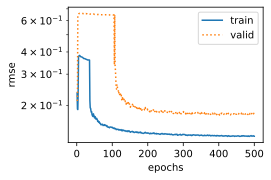

In [233]:
train_l, valid_l = k_fold(k, train_X, train_y, num_epochs, learning_rate, weight_decay, batch_size)
print('%d-fold validation: avg train rmse %f, avg valid rmse %f' % (k, train_l, valid_l))

In [236]:
# 网格调优
# lr 中心 : 0.0045
# wd 中心: 0.032
lr_tunning = [0.001, 0.002, 0.003, 0.004, 0.005, 0.006, 0.007, 0.008, 0.009, 0.01]  # 0.003 ~ 0.1, step: 0.004
wd_tunning = [0.01, 0.02, 0.03, 0.04, 0.05, 0.06, 0.07, 0.08, 0.09, 0.1]  # 0 ~ 10
train_results = nd.zeros((len(lr_tunning), len(wd_tunning)))
valid_results = nd.zeros((len(lr_tunning), len(wd_tunning)))
for i, try_lr in enumerate(lr_tunning):
    for j, try_wd in enumerate(wd_tunning):
        tunning_num_epochs = int(0.0045 / try_lr * num_epochs) if try_lr < 0.0045 else num_epochs
        train_l, valid_l = k_fold(k, train_X, train_y, tunning_num_epochs, try_lr, try_wd, batch_size)
        train_results[i][j] = train_l
        valid_results[i][j] = valid_l
        print('Learning Rate: {}, Weight Decay: {}, avg train rmse: {}, avg valid rmse: {}'.format(
            try_lr, try_wd, train_l, valid_l))

fold 0, train rmse 0.130136, valid rmse 0.198073
fold 1, train rmse 0.131633, valid rmse 0.120169
fold 2, train rmse 0.132842, valid rmse 0.127790
fold 3, train rmse 0.118330, valid rmse 0.178075
fold 4, train rmse 0.117062, valid rmse 0.178416
Learning Rate: 0.001, Weight Decay: 0.01, avg train rmse: 0.1260004609823227, avg valid rmse: 0.16050469279289245
fold 0, train rmse 0.130998, valid rmse 0.184449
fold 1, train rmse 0.132242, valid rmse 0.120663
fold 2, train rmse 0.133998, valid rmse 0.125106
fold 3, train rmse 0.119861, valid rmse 0.174413
fold 4, train rmse 0.118478, valid rmse 0.178622
Learning Rate: 0.001, Weight Decay: 0.02, avg train rmse: 0.1271153748035431, avg valid rmse: 0.15665052831172943
fold 0, train rmse 0.132127, valid rmse 0.178091
fold 1, train rmse 0.133149, valid rmse 0.121734
fold 2, train rmse 0.135278, valid rmse 0.123706
fold 3, train rmse 0.121644, valid rmse 0.172015
fold 4, train rmse 0.120199, valid rmse 0.179470
Learning Rate: 0.001, Weight Decay: 0

fold 0, train rmse 0.133211, valid rmse 0.174916
fold 1, train rmse 0.134283, valid rmse 0.123112
fold 2, train rmse 0.136613, valid rmse 0.122993
fold 3, train rmse 0.123694, valid rmse 0.170352
fold 4, train rmse 0.122118, valid rmse 0.180543
Learning Rate: 0.003, Weight Decay: 0.04, avg train rmse: 0.12998411655426026, avg valid rmse: 0.1543831542134285
fold 0, train rmse 0.134648, valid rmse 0.174658
fold 1, train rmse 0.135240, valid rmse 0.124356
fold 2, train rmse 0.137487, valid rmse 0.122286
fold 3, train rmse 0.125300, valid rmse 0.169157
fold 4, train rmse 0.124108, valid rmse 0.181410
Learning Rate: 0.003, Weight Decay: 0.05, avg train rmse: 0.13135637640953063, avg valid rmse: 0.15437355786561965
fold 0, train rmse 0.135671, valid rmse 0.175037
fold 1, train rmse 0.135806, valid rmse 0.125495
fold 2, train rmse 0.139281, valid rmse 0.122319
fold 3, train rmse 0.126620, valid rmse 0.168201
fold 4, train rmse 0.126821, valid rmse 0.182871
Learning Rate: 0.003, Weight Decay: 

fold 0, train rmse 0.136535, valid rmse 0.175598
fold 1, train rmse 0.135951, valid rmse 0.126384
fold 2, train rmse 0.139225, valid rmse 0.122070
fold 3, train rmse 0.128120, valid rmse 0.167670
fold 4, train rmse 0.127241, valid rmse 0.181235
Learning Rate: 0.005, Weight Decay: 0.07, avg train rmse: 0.13341435492038728, avg valid rmse: 0.15459119230508805
fold 0, train rmse 0.136690, valid rmse 0.173592
fold 1, train rmse 0.136767, valid rmse 0.127309
fold 2, train rmse 0.140942, valid rmse 0.121867
fold 3, train rmse 0.129272, valid rmse 0.167154
fold 4, train rmse 0.130868, valid rmse 0.183072
Learning Rate: 0.005, Weight Decay: 0.08, avg train rmse: 0.13490776419639589, avg valid rmse: 0.15459881722927094
fold 0, train rmse 0.138484, valid rmse 0.180363
fold 1, train rmse 0.137414, valid rmse 0.128279
fold 2, train rmse 0.142260, valid rmse 0.122420
fold 3, train rmse 0.131113, valid rmse 0.166992
fold 4, train rmse 0.132929, valid rmse 0.183251
Learning Rate: 0.005, Weight Decay:

fold 0, train rmse 0.137602, valid rmse 0.170585
fold 1, train rmse 0.136997, valid rmse 0.128158
fold 2, train rmse 0.140099, valid rmse 0.122314
fold 3, train rmse 0.130065, valid rmse 0.166688
fold 4, train rmse 0.131565, valid rmse 0.179481
Learning Rate: 0.007, Weight Decay: 0.1, avg train rmse: 0.1352655589580536, avg valid rmse: 0.1534451961517334
fold 0, train rmse 0.129849, valid rmse 0.217089
fold 1, train rmse 0.129892, valid rmse 0.121250
fold 2, train rmse 0.132073, valid rmse 0.130076
fold 3, train rmse 0.116427, valid rmse 0.178956
fold 4, train rmse 0.115968, valid rmse 0.179206
Learning Rate: 0.008, Weight Decay: 0.01, avg train rmse: 0.12484168112277985, avg valid rmse: 0.16531557440757752
fold 0, train rmse 0.129753, valid rmse 0.184932
fold 1, train rmse 0.131260, valid rmse 0.120699
fold 2, train rmse 0.133179, valid rmse 0.125574
fold 3, train rmse 0.119380, valid rmse 0.174711
fold 4, train rmse 0.118353, valid rmse 0.178981
Learning Rate: 0.008, Weight Decay: 0.

fold 0, train rmse 0.130617, valid rmse 0.172638
fold 1, train rmse 0.132652, valid rmse 0.121622
fold 2, train rmse 0.136538, valid rmse 0.124502
fold 3, train rmse 0.120718, valid rmse 0.172407
fold 4, train rmse 0.117876, valid rmse 0.175003
Learning Rate: 0.01, Weight Decay: 0.03, avg train rmse: 0.12768032997846604, avg valid rmse: 0.1532343938946724
fold 0, train rmse 0.133281, valid rmse 0.172682
fold 1, train rmse 0.134017, valid rmse 0.122875
fold 2, train rmse 0.134541, valid rmse 0.122964
fold 3, train rmse 0.122888, valid rmse 0.170574
fold 4, train rmse 0.122018, valid rmse 0.178732
Learning Rate: 0.01, Weight Decay: 0.04, avg train rmse: 0.12934874296188353, avg valid rmse: 0.15356553345918655
fold 0, train rmse 0.135643, valid rmse 0.171560
fold 1, train rmse 0.133709, valid rmse 0.123694
fold 2, train rmse 0.136401, valid rmse 0.122569
fold 3, train rmse 0.124385, valid rmse 0.169811
fold 4, train rmse 0.122732, valid rmse 0.178030
Learning Rate: 0.01, Weight Decay: 0.0

/Users/zhibin.jiang/Learning/EnvLearning/lib/python3.7/site-packages/IPython/core/events.py:88: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  func(*args, **kwargs)
/Users/zhibin.jiang/Learning/EnvLearning/lib/python3.7/site-packages/IPython/core/pylabtools.py:128: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


In [268]:
def plot_3d(array):
    from mpl_toolkits.mplot3d import Axes3D
    x, y, z = list(), list(), list()
    for i, row in enumerate(array):
        for j, col in enumerate(row):
            x.append(i)
            y.append(j)
            z.append(col)
    fig =plt.figure()
    ax = plt.axes(projection='3d')
#     ax.plot3D(x, y, z, color='c')
    ax.plot3D(x, y, z)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_zlabel('z')

In [282]:
valid_results==0.1506419


[[0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]]
<NDArray 10x10 @cpu(0)>

(0.01, array([0.16536516, 0.15618423, 0.15323439, 0.15356553, 0.15313295,
        0.1536532 , 0.15073867, 0.15301129, 0.1506419 , 0.15272811],
       dtype=float32))

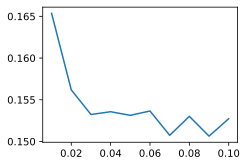

In [311]:
ind = 9
plt.plot(wd_tunning, valid_results.asnumpy()[ind])
lr_tunning[ind], valid_results.asnumpy()[ind]
# 下降趋势: 7, 8, 9

(0.1, array([0.16536516, 0.15618423, 0.15323439, 0.15356553, 0.15313295,
        0.1536532 , 0.15073867, 0.15301129, 0.1506419 , 0.15272811],
       dtype=float32))

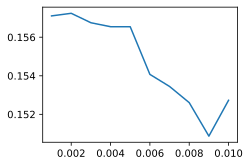

In [313]:
ind = 9
plt.plot(lr_tunning, valid_results.T.asnumpy()[ind])
wd_tunning[ind], valid_results.asnumpy()[ind]
# 下降趋势: 6, 8

In [315]:
def float_range(start, end, step):
    result = list()
    counter = 1
    temp = start
    while True:
        if temp < end:
            result.append(temp)
            temp += step
        elif temp == end:
            return [temp]
        else:
            break
    return result

In [318]:
float_range(0.008, 0.008 + (10 * 0.0005), 0.0005)

[0.008,
 0.0085,
 0.009000000000000001,
 0.009500000000000001,
 0.010000000000000002,
 0.010500000000000002,
 0.011000000000000003,
 0.011500000000000003,
 0.012000000000000004,
 0.012500000000000004]

In [319]:
# 网格调优
# lr 中心 : 0.008 > 10. 0.0005
# wd 中心: 0.07 > 10, 0.005
lr_tunning = float_range(0.008, 0.008 + (10 * 0.0005), 0.0005)  # 0.003 ~ 0.1, step: 0.004
wd_tunning = float_range(0.07, 0.07 + (10 * 0.005), 0.005)  # 0 ~ 10
train_results = nd.zeros((len(lr_tunning), len(wd_tunning)))
valid_results = nd.zeros((len(lr_tunning), len(wd_tunning)))
for i, try_lr in enumerate(lr_tunning):
    for j, try_wd in enumerate(wd_tunning):
        train_l, valid_l = k_fold(k, train_X, train_y, num_epochs, try_lr, try_wd, batch_size)
        train_results[i][j] = train_l
        valid_results[i][j] = valid_l
        print('Learning Rate: {}, Weight Decay: {}, avg train rmse: {}, avg valid rmse: {}'.format(
            try_lr, try_wd, train_l, valid_l))

[0.008, 0.0085, 0.009000000000000001, 0.009500000000000001, 0.010000000000000002, 0.010500000000000002, 0.011000000000000003, 0.011500000000000003, 0.012000000000000004, 0.012500000000000004]
[0.07, 0.07500000000000001, 0.08000000000000002, 0.08500000000000002, 0.09000000000000002, 0.09500000000000003, 0.10000000000000003, 0.10500000000000004, 0.11000000000000004, 0.11500000000000005]
fold 0, train rmse 0.137222, valid rmse 0.172775
fold 1, train rmse 0.134617, valid rmse 0.125288
fold 2, train rmse 0.137418, valid rmse 0.122072
fold 3, train rmse 0.127324, valid rmse 0.167974
fold 4, train rmse 0.126325, valid rmse 0.179160
Learning Rate: 0.008, Weight Decay: 0.07, avg train rmse: 0.13258127868175507, avg valid rmse: 0.15345371812582015
fold 0, train rmse 0.136081, valid rmse 0.168284
fold 1, train rmse 0.135746, valid rmse 0.126133
fold 2, train rmse 0.138419, valid rmse 0.121785
fold 3, train rmse 0.127716, valid rmse 0.167871
fold 4, train rmse 0.130116, valid rmse 0.182007
Learnin

fold 0, train rmse 0.135010, valid rmse 0.163470
fold 1, train rmse 0.134586, valid rmse 0.125656
fold 2, train rmse 0.139261, valid rmse 0.122531
fold 3, train rmse 0.127642, valid rmse 0.168005
fold 4, train rmse 0.126683, valid rmse 0.178179
Learning Rate: 0.009000000000000001, Weight Decay: 0.07500000000000001, avg train rmse: 0.13263632655143737, avg valid rmse: 0.15156809240579605
fold 0, train rmse 0.138186, valid rmse 0.172761
fold 1, train rmse 0.138174, valid rmse 0.127472
fold 2, train rmse 0.138402, valid rmse 0.121972
fold 3, train rmse 0.128970, valid rmse 0.167869
fold 4, train rmse 0.127722, valid rmse 0.178212
Learning Rate: 0.009000000000000001, Weight Decay: 0.08000000000000002, avg train rmse: 0.13429069221019746, avg valid rmse: 0.15365706384181976
fold 0, train rmse 0.134285, valid rmse 0.157548
fold 1, train rmse 0.136322, valid rmse 0.126669
fold 2, train rmse 0.139600, valid rmse 0.122261
fold 3, train rmse 0.127923, valid rmse 0.167310
fold 4, train rmse 0.128

fold 2, train rmse 0.140473, valid rmse 0.122307
fold 3, train rmse 0.129016, valid rmse 0.168716
fold 4, train rmse 0.125667, valid rmse 0.176812
Learning Rate: 0.010000000000000002, Weight Decay: 0.08000000000000002, avg train rmse: 0.1332641452550888, avg valid rmse: 0.15185356736183167
fold 0, train rmse 0.138249, valid rmse 0.168168
fold 1, train rmse 0.136391, valid rmse 0.127028
fold 2, train rmse 0.141719, valid rmse 0.123774
fold 3, train rmse 0.129062, valid rmse 0.167945
fold 4, train rmse 0.130169, valid rmse 0.179690
Learning Rate: 0.010000000000000002, Weight Decay: 0.08500000000000002, avg train rmse: 0.13511820137500763, avg valid rmse: 0.15332116186618805
fold 0, train rmse 0.138525, valid rmse 0.170627
fold 1, train rmse 0.133531, valid rmse 0.126946
fold 2, train rmse 0.142377, valid rmse 0.123404
fold 3, train rmse 0.130217, valid rmse 0.168694
fold 4, train rmse 0.125733, valid rmse 0.175054
Learning Rate: 0.010000000000000002, Weight Decay: 0.09000000000000002, av

fold 3, train rmse 0.127034, valid rmse 0.167569
fold 4, train rmse 0.125900, valid rmse 0.174960
Learning Rate: 0.011000000000000003, Weight Decay: 0.08500000000000002, avg train rmse: 0.1333889365196228, avg valid rmse: 0.15049319714307785
fold 0, train rmse 0.134136, valid rmse 0.152609
fold 1, train rmse 0.134415, valid rmse 0.127004
fold 2, train rmse 0.137899, valid rmse 0.122562
fold 3, train rmse 0.128520, valid rmse 0.168785
fold 4, train rmse 0.131039, valid rmse 0.179958
Learning Rate: 0.011000000000000003, Weight Decay: 0.09000000000000002, avg train rmse: 0.13320170044898988, avg valid rmse: 0.15018343776464463
fold 0, train rmse 0.134978, valid rmse 0.154709
fold 1, train rmse 0.134989, valid rmse 0.126897
fold 2, train rmse 0.137091, valid rmse 0.121806
fold 3, train rmse 0.127995, valid rmse 0.167891
fold 4, train rmse 0.127864, valid rmse 0.176513
Learning Rate: 0.011000000000000003, Weight Decay: 0.09500000000000003, avg train rmse: 0.13258348703384398, avg valid rmse

KeyboardInterrupt: 

In [ ]:
# 网格调优
# lr 中心 : 0.011
# wd 中心: 0.1
lr_tunning = float_range(0.008, 0.008 + (10 * 0.0005), 0.0005)  # 0.003 ~ 0.1, step: 0.004
wd_tunning = float_range(0.07, 0.07 + (10 * 0.005), 0.005)  # 0 ~ 10
train_results = nd.zeros((len(lr_tunning), len(wd_tunning)))
valid_results = nd.zeros((len(lr_tunning), len(wd_tunning)))
for i, try_lr in enumerate(lr_tunning):
    for j, try_wd in enumerate(wd_tunning):
        train_l, valid_l = k_fold(k, train_X, train_y, num_epochs, try_lr, try_wd, batch_size)
        train_results[i][j] = train_l
        valid_results[i][j] = valid_l
        print('Learning Rate: {}, Weight Decay: {}, avg train rmse: {}, avg valid rmse: {}'.format(
            try_lr, try_wd, train_l, valid_l))

In [320]:
def train_and_pred(lr, wd):
    net = get_net()
    train_ls, _ = train(net, train_X, train_y, None, None, num_epochs, lr, wd, batch_size)
    print("Trainning history: ", train_ls)
    semilogy(range(1, num_epochs + 1), train_ls, 'epochs', 'rmse')
    generate_submission(net, test_X)
    
def generate_submission(net, test_x):
    preds = net(test_x).asnumpy()
    test_data['SalePrice'] = pd.Series(preds.reshape(1, -1)[0])
    submission = pd.concat([test_data['Id'], test_data['SalePrice']], axis=1)
    submission.to_csv('submission.csv', index=False)
    return submission

In [323]:
test_X


[[-0.8734664   0.45809588  0.18433963 ...  0.          1.
   0.        ]
 [-0.8734664   0.5009318   0.5197018  ...  0.          1.
   0.        ]
 [ 0.06731988  0.20108049  0.4642941  ...  0.          1.
   0.        ]
 ...
 [-0.8734664   3.8849678   1.2465944  ...  0.          0.
   0.        ]
 [ 0.6553113  -0.3129503   0.03459947 ...  0.          1.
   0.        ]
 [ 0.06731988  0.20108049 -0.06860839 ...  0.          1.
   0.        ]]
<NDArray 1459x322 @cpu(0)>

Trainning history:  [0.33517048, 0.4476133, 0.45202807, 0.44088888, 0.43622732, 0.44318277, 0.43770698, 0.33452424, 0.32866883, 0.34022272, 0.33618402, 0.32131237, 0.31760943, 0.31851608, 0.31897697, 0.32049128, 0.3198483, 0.31924254, 0.31733888, 0.31533927, 0.31507462, 0.31237924, 0.31596702, 0.31456107, 0.31324947, 0.31545246, 0.31331074, 0.3133465, 0.31592023, 0.3135778, 0.31329384, 0.31309626, 0.15383077, 0.16946232, 0.31305057, 0.15264793, 0.3144597, 0.14782354, 0.14624764, 0.17097925, 0.14842448, 0.15072235, 0.15276915, 0.31475776, 0.22247767, 0.15310955, 0.15530087, 0.19240211, 0.14757563, 0.14172968, 0.14121427, 0.14506288, 0.15073076, 0.17722166, 0.14707364, 0.14963381, 0.15540406, 0.14769289, 0.15116967, 0.14515367, 0.14163142, 0.1486222, 0.14036222, 0.14214876, 0.14292133, 0.14518076, 0.14824767, 0.15624778, 0.14283007, 0.13930324, 0.14383309, 0.14513533, 0.15151736, 0.14174657, 0.14395303, 0.14707959, 0.14867054, 0.13985088, 0.14566153, 0.14538269, 0.14980024, 0.13956769, 0

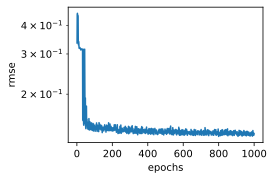

In [321]:
train_and_pred(0.011, 0.1)   # 0.1484

### Q&A
1. pd.get_dummies 怎么挑选的 离散型变量
    - Solution: object类型的